In [2]:
import numpy as np
from eryn.backends import HDFBackend as eryn_HDF_Backend
import matplotlib.pyplot as plt
import corner
import os
import warnings
import matplotlib.lines as mlines
from matplotlib.font_manager import FontProperties
plt.rcParams['font.size'] = 20

notebook_direc = os.getcwd()
plot_direc = notebook_direc + "/corner_plots"
run_direc = "/work/scratch/data/burkeol/kerr_few_paper/low_e0_simulations/"

os.listdir(run_direc)

['low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_e0_0p0001_SNR_50_dt_5_T_2.h5',
 'low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_e0_0p00001_SNR_50_dt_5_T_2.h5',
 'low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_e0_0p001_SNR_50_dt_5_T_2.h5',
 'low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_e0_0p1_SNR_50_dt_5_T_2.h5',
 'low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_e0_0p01_SNR_50_dt_5_T_2.h5']

In [3]:
# Now analyse the results using 9PN for circular orbits
    
def analyse_samples(file_path, discard = 0):
    reader = eryn_HDF_Backend(file_path,read_only = True)

    N_iterations = reader.get_chain()['model_0'].shape[0]
    N_temps = reader.get_chain()['model_0'].shape[1]
    N_walkers = reader.get_chain()['model_0'].shape[2]
    N_params = reader.get_chain()['model_0'].shape[-1]

    samples_after_burnin = [reader.get_chain(discard = discard)['model_0'][:,i].reshape(-1,N_params) 
                        for i in range(N_temps)]  # Take true chain]


    log_like = reader.get_log_like(discard = discard)
    plt.plot(log_like[:,0,:]);
    plt.xlabel(r'Iteration')
    plt.ylabel(r'Log likelihood')
    plt.show()
    return samples_after_burnin, reader, log_like, N_params,

def corner_plot(burned_samples, true_params, param_labels, corner_kwargs, weights = None, title = r'Corner plot', plot_name = None, trunc_samps = True):

    N_params = len(param_labels)
    true_params = true_params[0:N_params]

    trunc_samples = burned_samples[0][:,:N_params]
    # samples_corner = np.column_stack(trunc_samples)

    figure = corner.corner(trunc_samples,bins = 30, weights = weights, color = 'blue', **corner_kwargs)
    
    axes = np.array(figure.axes).reshape((N_params, N_params))

    for i in range(N_params):
        ax = axes[i, i]
        ax.axvline(true_params[i], color="k")

    for yi in range(N_params):
        for xi in range(yi):
            ax = axes[yi, xi]
            ax.axhline(true_params[yi], color="k")
            ax.axvline(true_params[xi],color= "k")
            ax.plot(true_params[xi], true_params[yi], "sk")

    for ax in figure.get_axes():
        ax.tick_params(axis='both', labelsize=18)

    blue_line = mlines.Line2D([], [], color='blue', label=r'Posterior Distributions')
    black_line = mlines.Line2D([], [], color='black', label='True Value')

    # plt.legend(handles=[blue_line,black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = title, title_fontproperties = FontProperties(size = , weight = 'bold'))
    # plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)
    if plot_name:
        plt.savefig(plot_name, bbox_inches = "tight")
    return figure



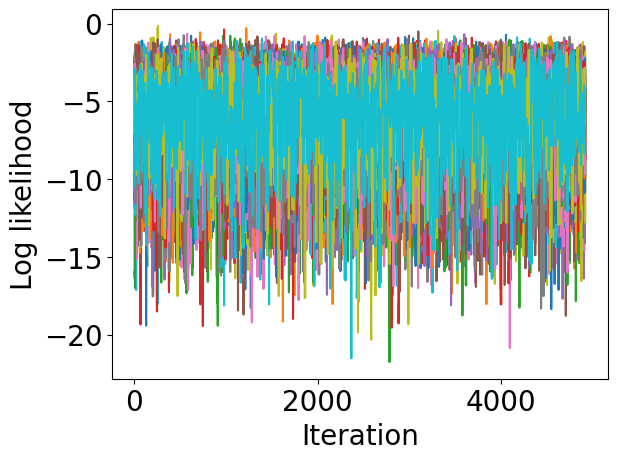

In [4]:
file_path = run_direc + 'low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_e0_0p1_SNR_50_dt_5_T_2.h5'

samples_after_burnin_EMRI_log_e0_neg_1, reader_EMRI_e0_0p1, log_like_IMRI_EMRI_e0_0p1, N_params = analyse_samples(file_path, discard = 600)

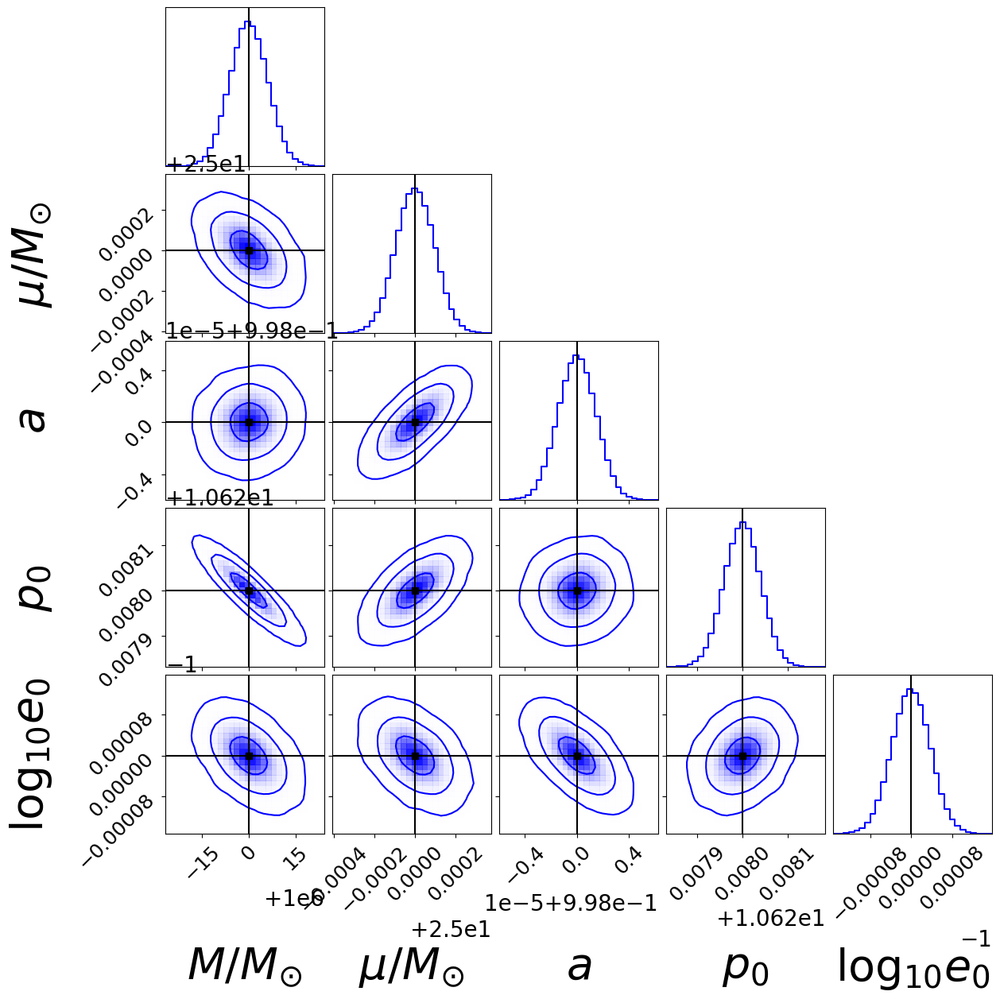

In [5]:
EMRI_plot_name_log_e0 = plot_direc + "/low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_log_e0_0p1_SNR_50_dt_5_T_2.h5.png"


params_label_log_e0 =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$\log_{10}e_{0}$"] 

true_vals = np.array([1e6,25,0.998, 10.628, np.log10(0.1), 7.28, 0.5, 1.2, 0.8, 0.2, 1.0, 3.0])

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_log_e0, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

figure_EMRI_0p1 = corner_plot(samples_after_burnin_EMRI_log_e0_neg_1, true_vals, params_label_log_e0, corner_kwargs, plot_name = EMRI_plot_name_log_e0)

In [6]:
# Now in original variables
import copy

samples_after_burnin_EMRI_e0_0p1 = copy.deepcopy(samples_after_burnin_EMRI_log_e0_neg_1)
samples_after_burnin_EMRI_e0_0p1[0][:,4] = 10**samples_after_burnin_EMRI_e0_0p1[0][:,4]

weights_e0_0p1 = samples_after_burnin_EMRI_e0_0p1[0][:,4] * np.log(10) 


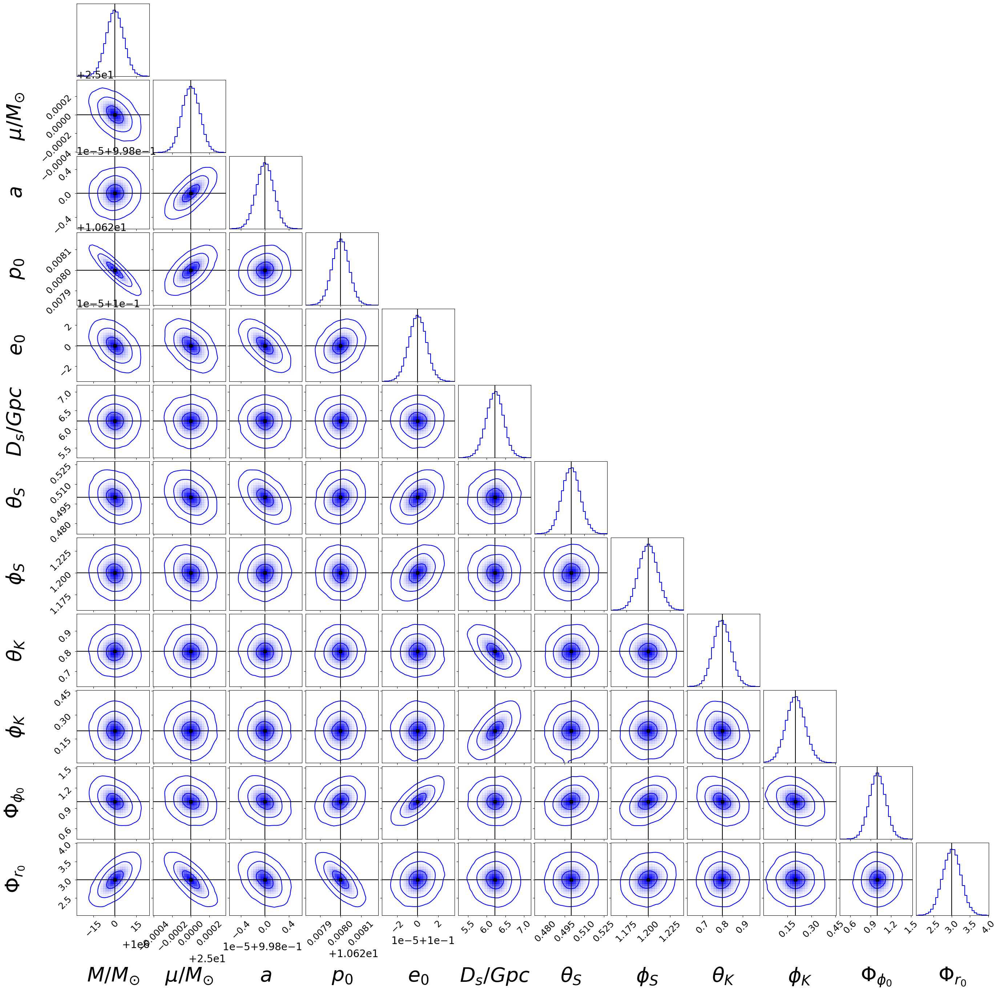

In [7]:


EMRI_plot_name_e0_0p1 = plot_direc + "/low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_e0_0p1_SNR_50_dt_5_T_2.h5.png"

params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 


dist_mean = np.mean(samples_after_burnin_EMRI_e0_0p1[0][:,5])
true_vals = np.array([1e6,25,0.998, 10.628, 0.1, dist_mean, 0.5, 1.2, 0.8, 0.2, 1.0, 3.0])

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

figure_EMRI_0p1 = corner_plot(samples_after_burnin_EMRI_e0_0p1, true_vals, params_label_full, corner_kwargs, weights = weights_e0_0p1, plot_name = EMRI_plot_name_e0_0p1)


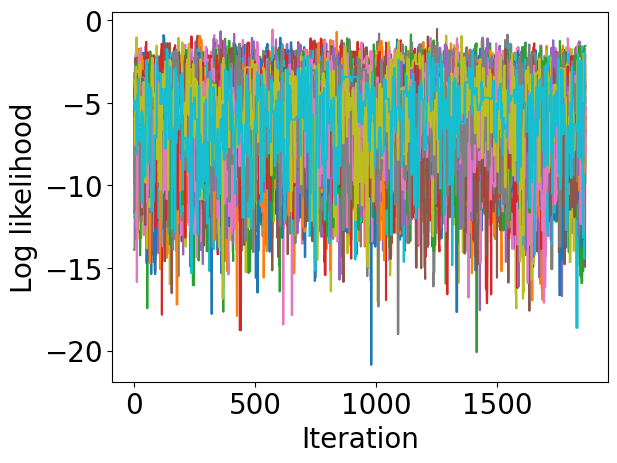

In [8]:
file_path = run_direc + 'low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_e0_0p01_SNR_50_dt_5_T_2.h5'

samples_after_burnin_EMRI_log_e0_neg_2, reader_EMRI_e0_0p01, log_like_IMRI_EMRI_e0_0p01, N_params = analyse_samples(file_path, discard = 1200)

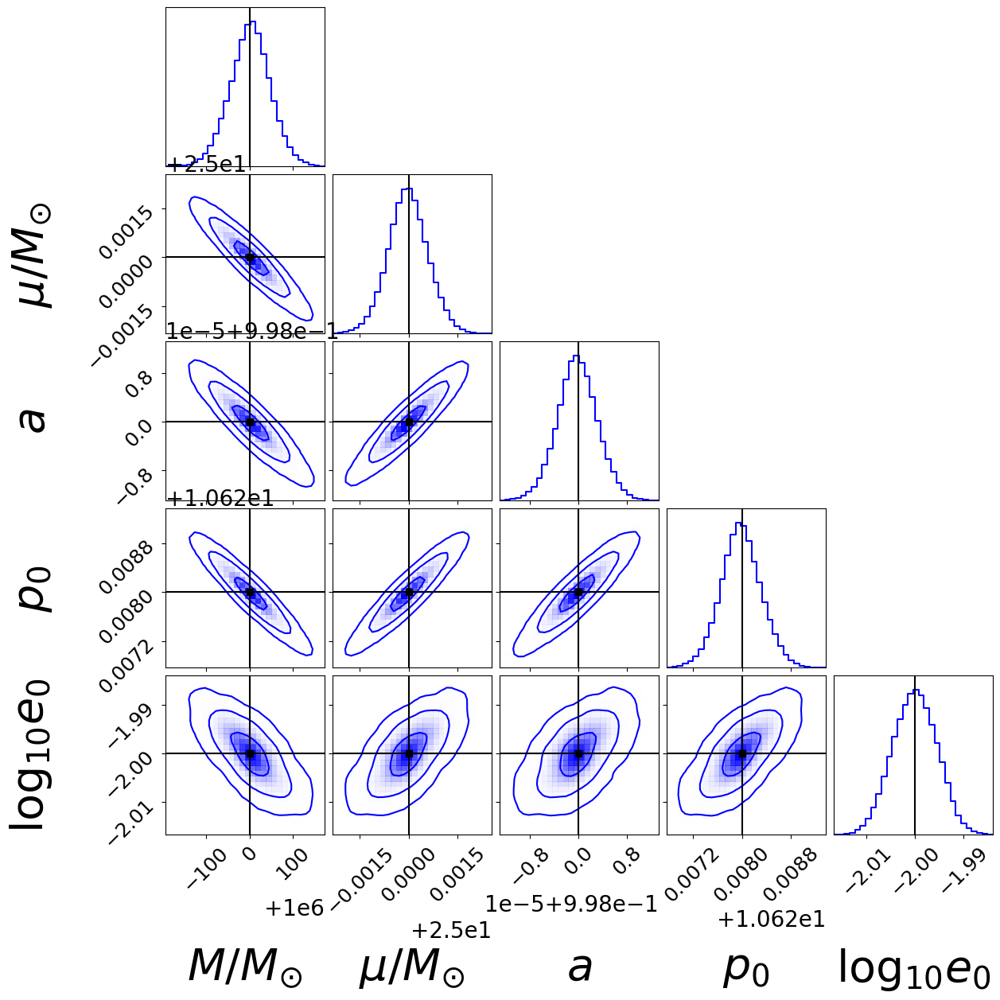

In [9]:
EMRI_plot_name_log_e0 = plot_direc + "/low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_log_e0_0p01_SNR_50_dt_5_T_2.h5.png"


params_label_log_e0 =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$\log_{10}e_{0}$"] 

true_vals = np.array([1e6,25,0.998, 10.628, np.log10(0.01), 7.28, 0.5, 1.2, 0.8, 0.2, 1.0, 3.0])

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_log_e0, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

figure_EMRI_0p01 = corner_plot(samples_after_burnin_EMRI_log_e0_neg_2, true_vals, params_label_log_e0, corner_kwargs, plot_name = EMRI_plot_name_log_e0)

In [10]:
# Now in original variables

samples_after_burnin_EMRI_e0_0p01 = copy.deepcopy(samples_after_burnin_EMRI_log_e0_neg_2)
samples_after_burnin_EMRI_e0_0p01[0][:,4] = 10**samples_after_burnin_EMRI_e0_0p01[0][:,4]

weights_e0_0p01 = samples_after_burnin_EMRI_e0_0p01[0][:,4] * np.log(10) 

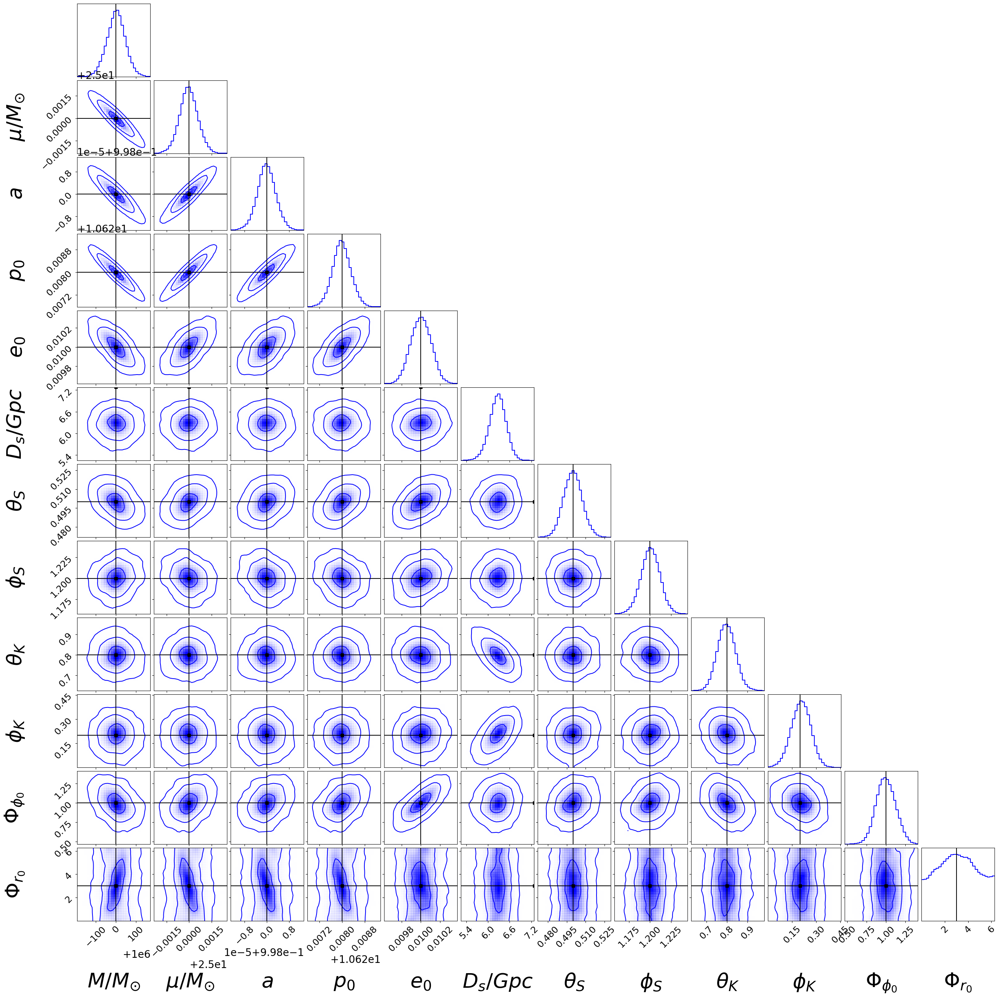

In [11]:


EMRI_plot_name_e0_0p01 = plot_direc + "/low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_e0_0p01_SNR_50_dt_5_T_2.h5.png"

params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 


true_vals = np.array([1e6,25,0.998, 10.628, 0.01, 7.28, 0.5, 1.2, 0.8, 0.2, 1.0, 3.0])

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

figure_EMRI_0p01 = corner_plot(samples_after_burnin_EMRI_e0_0p01, true_vals, params_label_full, corner_kwargs, weights = weights_e0_0p01, plot_name = EMRI_plot_name_e0_0p01)


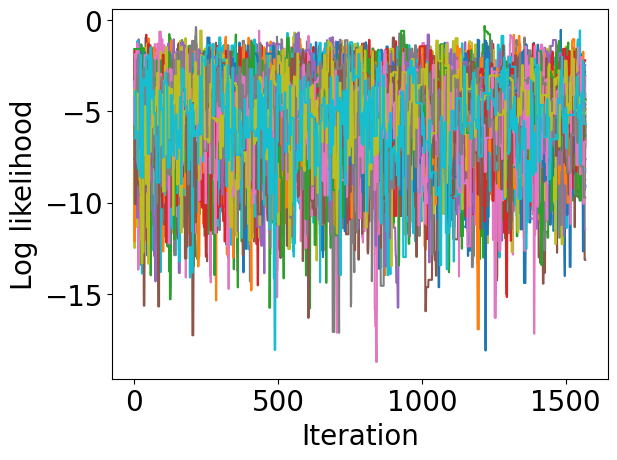

In [12]:
file_path = run_direc + 'low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_e0_0p001_SNR_50_dt_5_T_2.h5'

samples_after_burnin_EMRI_log_e0_neg_3, reader_EMRI_e0_0p001, log_like_IMRI_EMRI_e0_0p001, N_params = analyse_samples(file_path, discard = 500)

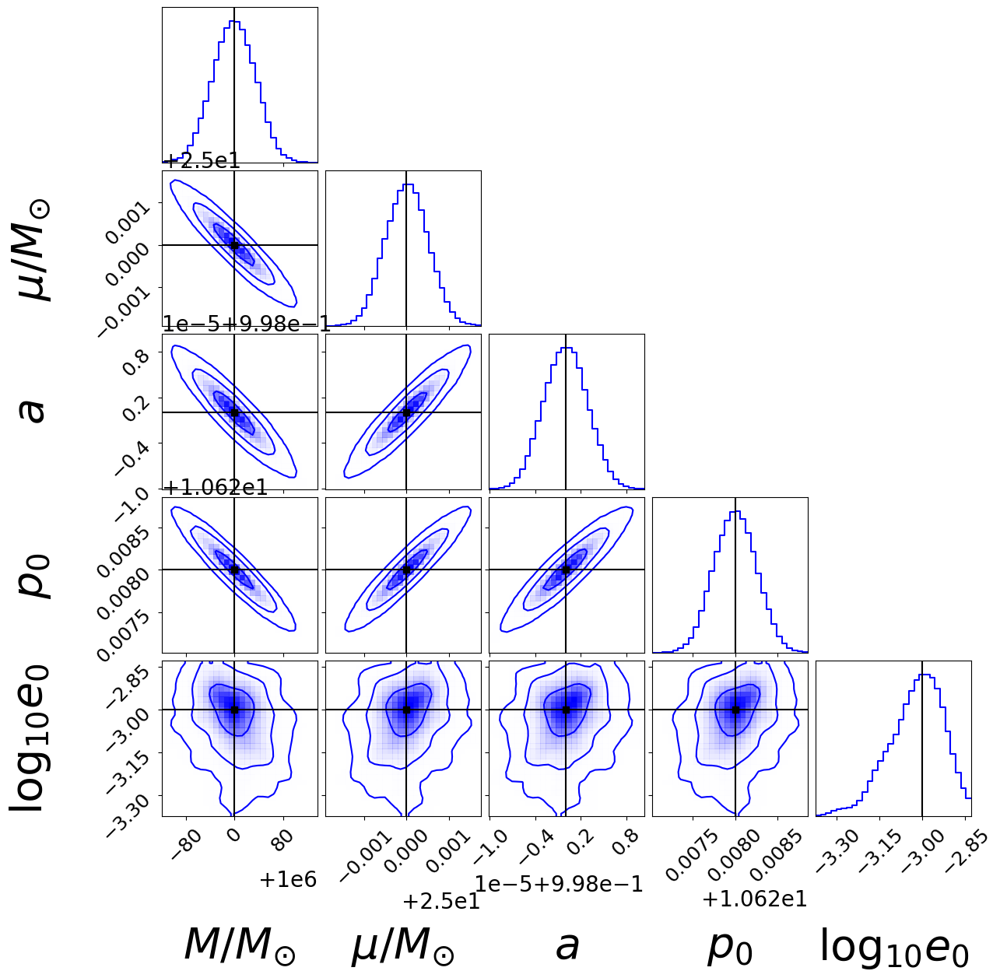

In [13]:
EMRI_plot_name_log_e0 = plot_direc + "/low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_log_e0_0p001_SNR_50_dt_5_T_2.h5.png"

# params_label =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
#                      r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
#                      r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
#                      r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

params_label_log_e0 =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$\log_{10}e_{0}$"] 

true_vals = np.array([1e6,25,0.998, 10.628, np.log10(0.001), 7.28, 0.5, 1.2, 0.8, 0.2, 1.0, 3.0])

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_log_e0, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

figure_EMRI_0p001 = corner_plot(samples_after_burnin_EMRI_log_e0_neg_3, true_vals, params_label_log_e0, corner_kwargs, plot_name = EMRI_plot_name_log_e0)

In [14]:
# Now in original variables

samples_after_burnin_EMRI_e0_0p001 = copy.deepcopy(samples_after_burnin_EMRI_log_e0_neg_3)
samples_after_burnin_EMRI_e0_0p001[0][:,4] = 10**samples_after_burnin_EMRI_e0_0p001[0][:,4]

# Need to reweight! 

# Compute weights
weights_e0_0p001 = samples_after_burnin_EMRI_e0_0p001[0][:,4] * np.log(10)

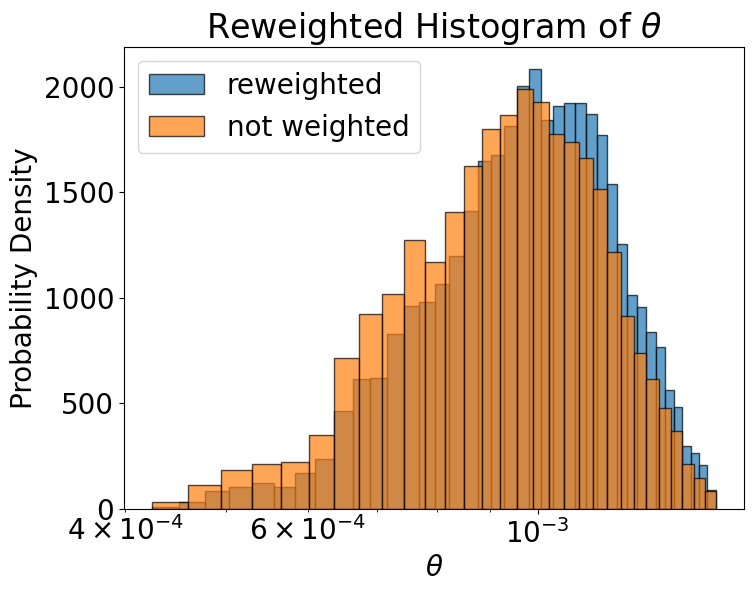

In [15]:
plt.figure(figsize=(8, 6))
plt.hist(samples_after_burnin_EMRI_e0_0p001[0][:,4], bins=40, weights=weights_e0_0p001, density=True, edgecolor='black', alpha=0.7, label = "reweighted")
plt.hist(samples_after_burnin_EMRI_e0_0p001[0][:,4], bins=30, density=True, edgecolor='black', alpha=0.7, label = "not weighted")
# Set log scale on x-axis
plt.xscale("log")
plt.xlabel(r'$\theta$')
plt.ylabel('Probability Density')
plt.title(r'Reweighted Histogram of $\theta$')
plt.legend()
plt.show()

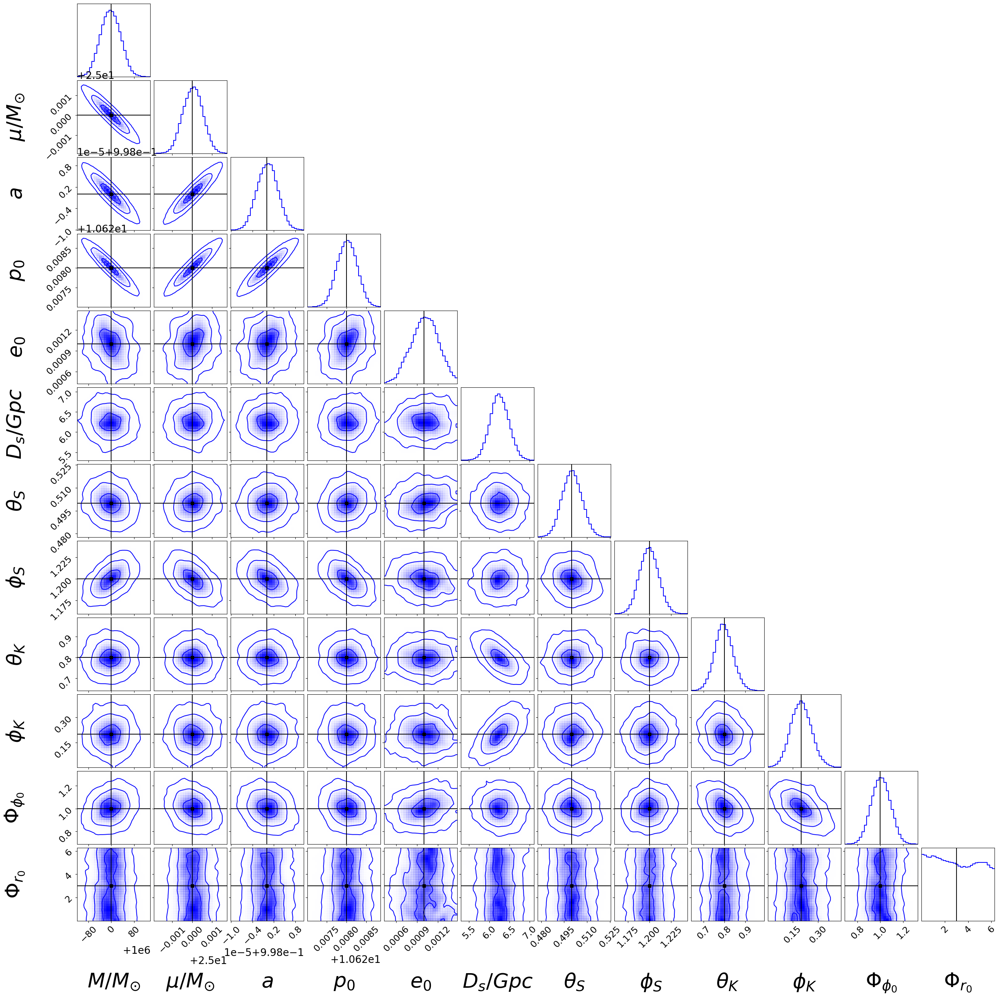

In [16]:


EMRI_plot_name_e0_0p001 = plot_direc + "/low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_e0_0p001_SNR_50_dt_5_T_2.h5.png"

params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

# params_label_log_e0 =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
#                      r"$p_{0}$", r"$e_{0}$"] 

true_vals = np.array([1e6,25,0.998, 10.628, 0.001, 7.28, 0.5, 1.2, 0.8, 0.2, 1.0, 3.0])

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

figure_EMRI_0p001 = corner_plot(samples_after_burnin_EMRI_e0_0p001, true_vals, params_label_full, corner_kwargs, weights = weights_e0_0p001, plot_name = EMRI_plot_name_e0_0p001)


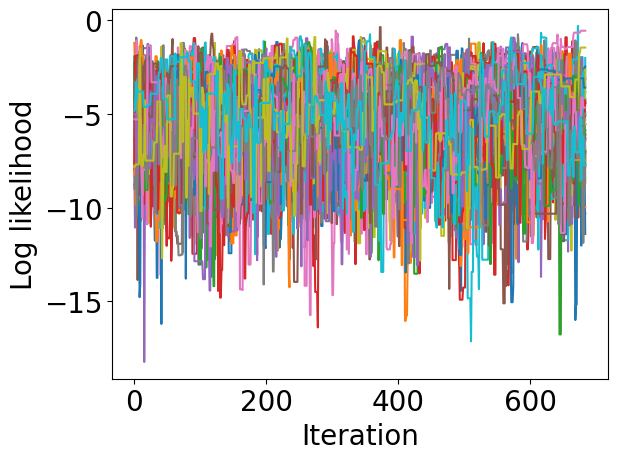

In [17]:
file_path = run_direc + 'low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_e0_0p0001_SNR_50_dt_5_T_2.h5'

samples_after_burnin_EMRI_log_e0_neg_4, reader_EMRI_e0_0p0001, log_like_EMRI_e0_0p0001, N_params = analyse_samples(file_path, discard = 600)

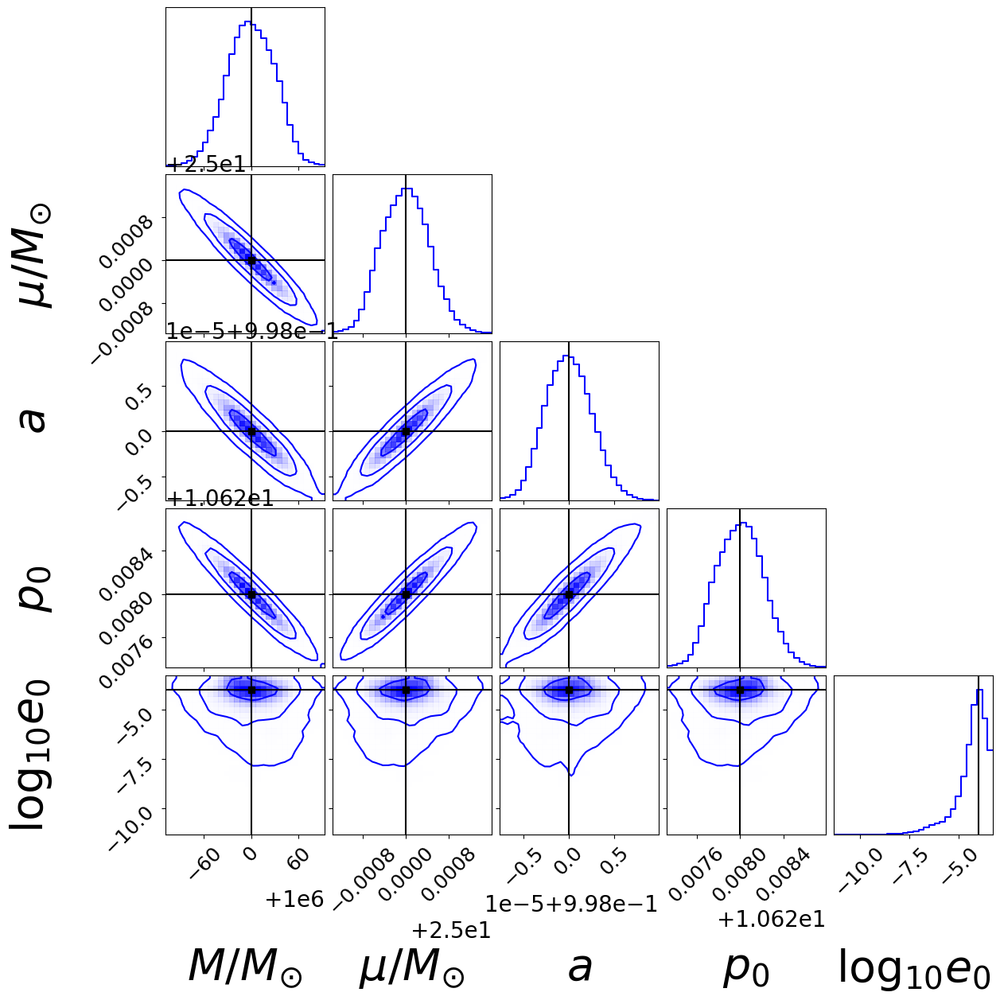

In [18]:
EMRI_plot_name_log_e0_neg4 = plot_direc + "/low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_log_e0_0p0001_SNR_50_dt_5_T_2.h5.png"

# params_label =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
#                      r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
#                      r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
#                      r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

params_label_log_e0 =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$\log_{10}e_{0}$"] 

true_vals = np.array([1e6,25,0.998, 10.628, np.log10(0.0001), 7.28, 0.5, 1.2, 0.8, 0.2, 1.0, 3.0])

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_log_e0, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

figure_EMRI_0p0001 = corner_plot(samples_after_burnin_EMRI_log_e0_neg_4, true_vals, params_label_log_e0, corner_kwargs, plot_name = EMRI_plot_name_log_e0_neg4)

In [19]:
# Now in original variables

samples_after_burnin_EMRI_e0_0p0001 = copy.deepcopy(samples_after_burnin_EMRI_log_e0_neg_4)
samples_after_burnin_EMRI_e0_0p0001[0][:,4] = 10**samples_after_burnin_EMRI_e0_0p0001[0][:,4]

weights_e0_0p0001 = samples_after_burnin_EMRI_e0_0p0001[0][:,4] * np.log(10)

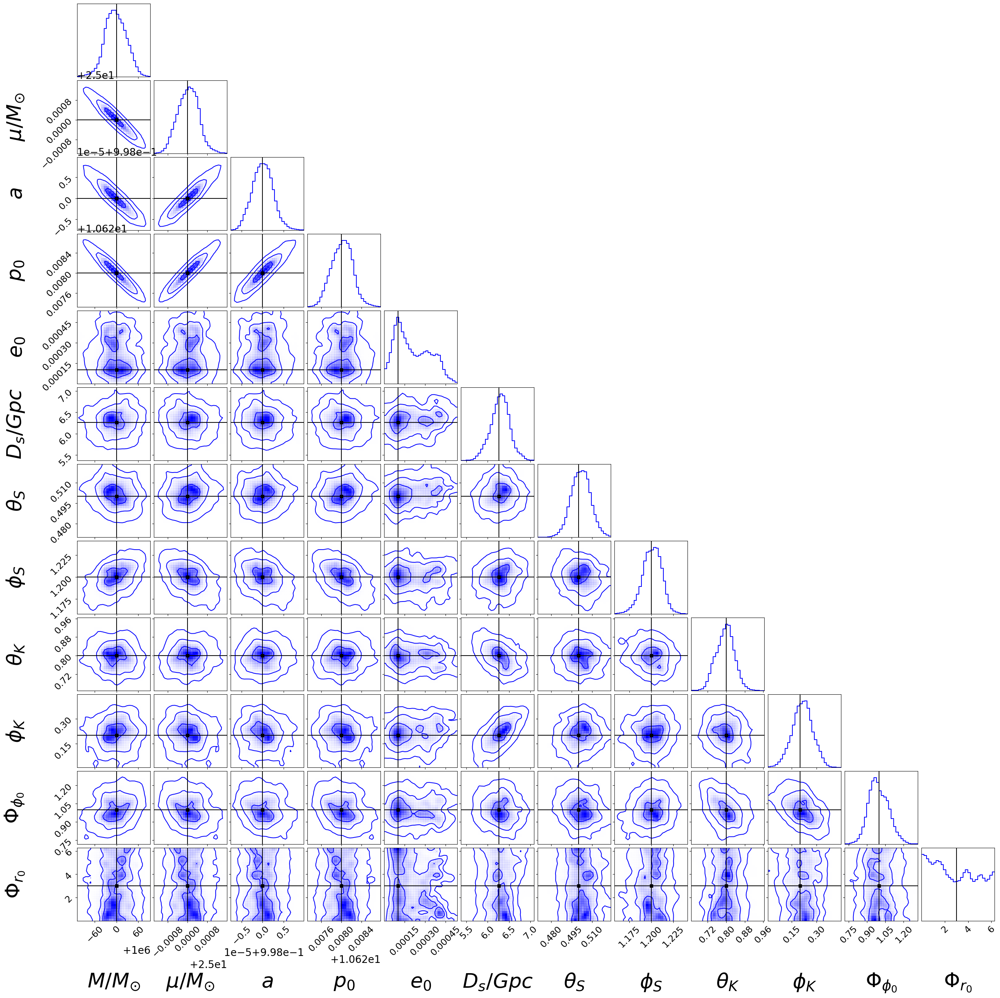

In [20]:
EMRI_plot_name_e0_0p0001 = plot_direc + "/low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_e0_0p0001_SNR_50_dt_5_T_2.h5.png"

params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

dist_mean = np.mean(samples_after_burnin_EMRI_e0_0p0001[0][:,5])
true_vals = np.array([1e6,25,0.998, 10.628, 0.0001, dist_mean, 0.5, 1.2, 0.8, 0.2, 1.0, 3.0])

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

figure_EMRI_0p001 = corner_plot(samples_after_burnin_EMRI_e0_0p0001, true_vals, params_label_full, corner_kwargs, weights = weights_e0_0p0001, plot_name = EMRI_plot_name_e0_0p0001)


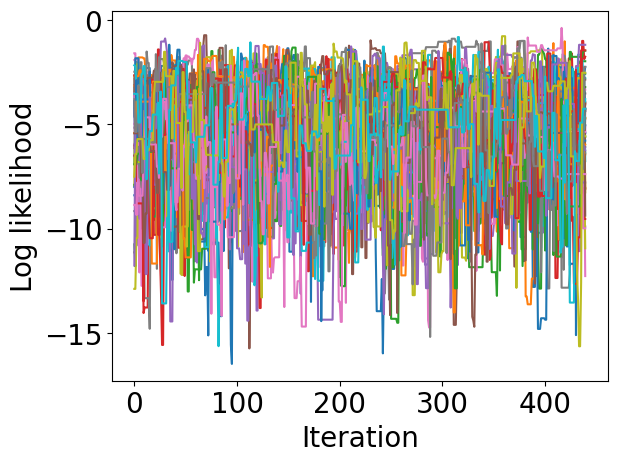

In [21]:
file_path = run_direc + 'low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_e0_0p00001_SNR_50_dt_5_T_2.h5'

samples_after_burnin_EMRI_log_e0_neg_5, reader_EMRI_e0_0p00001, log_like_IMRI_EMRI_e0_0p00001, N_params = analyse_samples(file_path, discard = 500)

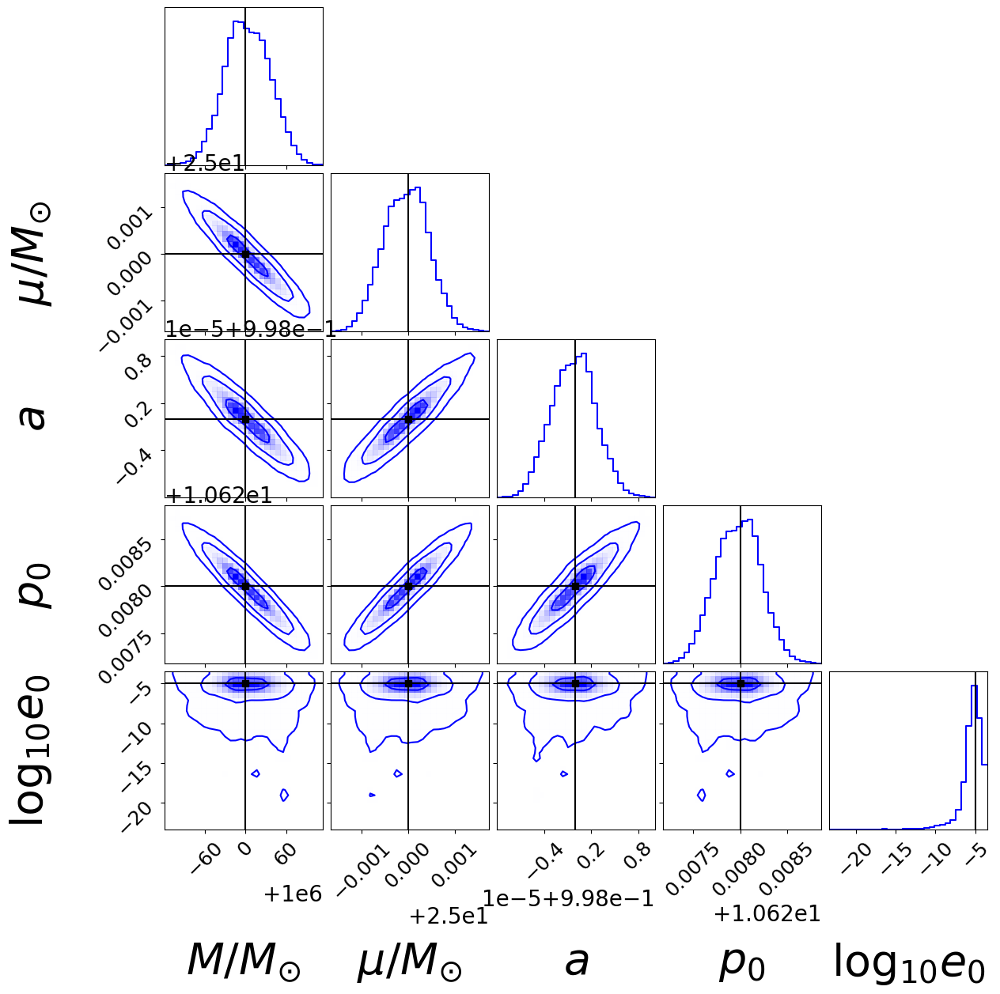

In [22]:
EMRI_plot_name_log_e0_neg5 = plot_direc + "/low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_log_e0_0p00001_SNR_50_dt_5_T_2.h5.png"

# params_label =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
#                      r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
#                      r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
#                      r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

params_label_log_e0 =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$\log_{10}e_{0}$"] 

true_vals = np.array([1e6,25,0.998, 10.628, np.log10(0.00001), 7.28, 0.5, 1.2, 0.8, 0.2, 1.0, 3.0])

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_log_e0, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

figure_EMRI_0p00001 = corner_plot(samples_after_burnin_EMRI_log_e0_neg_5, true_vals, params_label_log_e0, corner_kwargs, plot_name = EMRI_plot_name_log_e0_neg5)

In [23]:
# Now in original variables

samples_after_burnin_EMRI_e0_0p00001 = copy.deepcopy(samples_after_burnin_EMRI_log_e0_neg_5)
samples_after_burnin_EMRI_e0_0p00001[0][:,4] = 10**samples_after_burnin_EMRI_e0_0p00001[0][:,4]

weights_e0_0p00001 = samples_after_burnin_EMRI_e0_0p00001[0][:,4] * np.log(10)

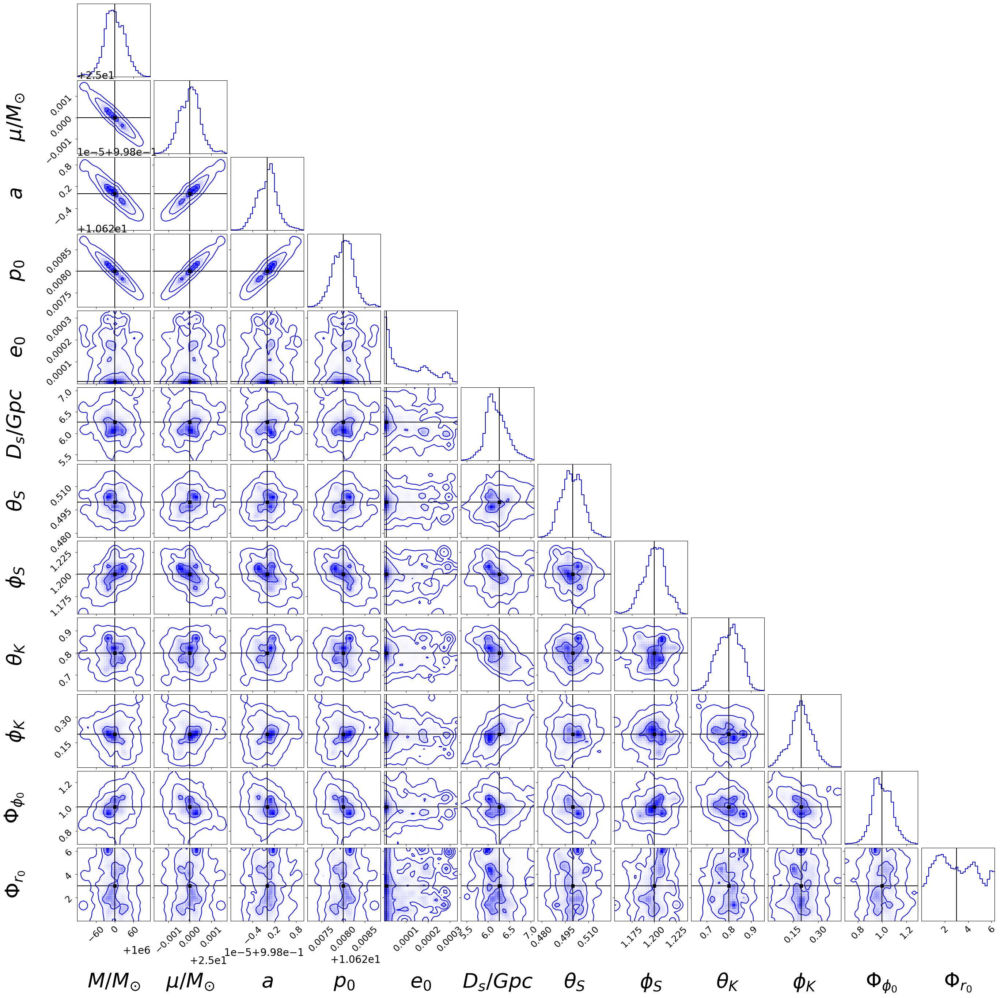

In [24]:
EMRI_plot_name_e0_0p00001 = plot_direc + "/low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_e0_0p00001_SNR_50_dt_5_T_2.h5.png"

params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

dist_mean = np.mean(samples_after_burnin_EMRI_e0_0p0001[0][:,5])
true_vals = np.array([1e6,25,0.998, 10.628, 0.00001, dist_mean, 0.5, 1.2, 0.8, 0.2, 1.0, 3.0])

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

figure_EMRI_0p00001 = corner_plot(samples_after_burnin_EMRI_e0_0p00001, true_vals, params_label_full, corner_kwargs, weights = weights_e0_0p00001, plot_name = EMRI_plot_name_e0_0p00001)


In [25]:
No_samples = 50000
samples_after_burnin_EMRI_log_e0_neg_1_w_radial_phase = np.column_stack(np.array([samples_after_burnin_EMRI_log_e0_neg_1[0][:,j][-No_samples:] for j in [0,1,2,3,4,-1]]))
samples_after_burnin_EMRI_log_e0_neg_2_w_radial_phase = np.column_stack(np.array([samples_after_burnin_EMRI_log_e0_neg_2[0][:,j][-No_samples:] for j in [0,1,2,3,4,-1]]))
samples_after_burnin_EMRI_log_e0_neg_3_w_radial_phase = np.column_stack(np.array([samples_after_burnin_EMRI_log_e0_neg_3[0][:,j][-No_samples:] for j in [0,1,2,3,4,-1]]))
samples_after_burnin_EMRI_log_e0_neg_4_w_radial_phase = np.column_stack(np.array([samples_after_burnin_EMRI_log_e0_neg_4[0][:,j][-No_samples:] for j in [0,1,2,3,4,-1]]))
samples_after_burnin_EMRI_log_e0_neg_5_w_radial_phase = np.column_stack(np.array([samples_after_burnin_EMRI_log_e0_neg_5[0][:,j][-No_samples:] for j in [0,1,2,3,4,-1]]))

samples_after_burnin_EMRI_e0_0p1_w_radial_phase = np.column_stack(np.array([samples_after_burnin_EMRI_e0_0p1[0][:,j][-No_samples:] for j in [0,1,2,3,4,-1]]))
samples_after_burnin_EMRI_e0_0p01_w_radial_phase = np.column_stack(np.array([samples_after_burnin_EMRI_e0_0p01[0][:,j][-No_samples:] for j in [0,1,2,3,4,-1]]))
samples_after_burnin_EMRI_e0_0p001_w_radial_phase = np.column_stack(np.array([samples_after_burnin_EMRI_e0_0p001[0][:,j][-No_samples:] for j in [0,1,2,3,4,-1]]))
samples_after_burnin_EMRI_e0_0p0001_w_radial_phase = np.column_stack(np.array([samples_after_burnin_EMRI_e0_0p0001[0][:,j][-No_samples:] for j in [0,1,2,3,4,-1]]))
samples_after_burnin_EMRI_e0_0p00001_w_radial_phase = np.column_stack(np.array([samples_after_burnin_EMRI_e0_0p00001[0][:,j][-No_samples:] for j in [0,1,2,3,4,-1]]))


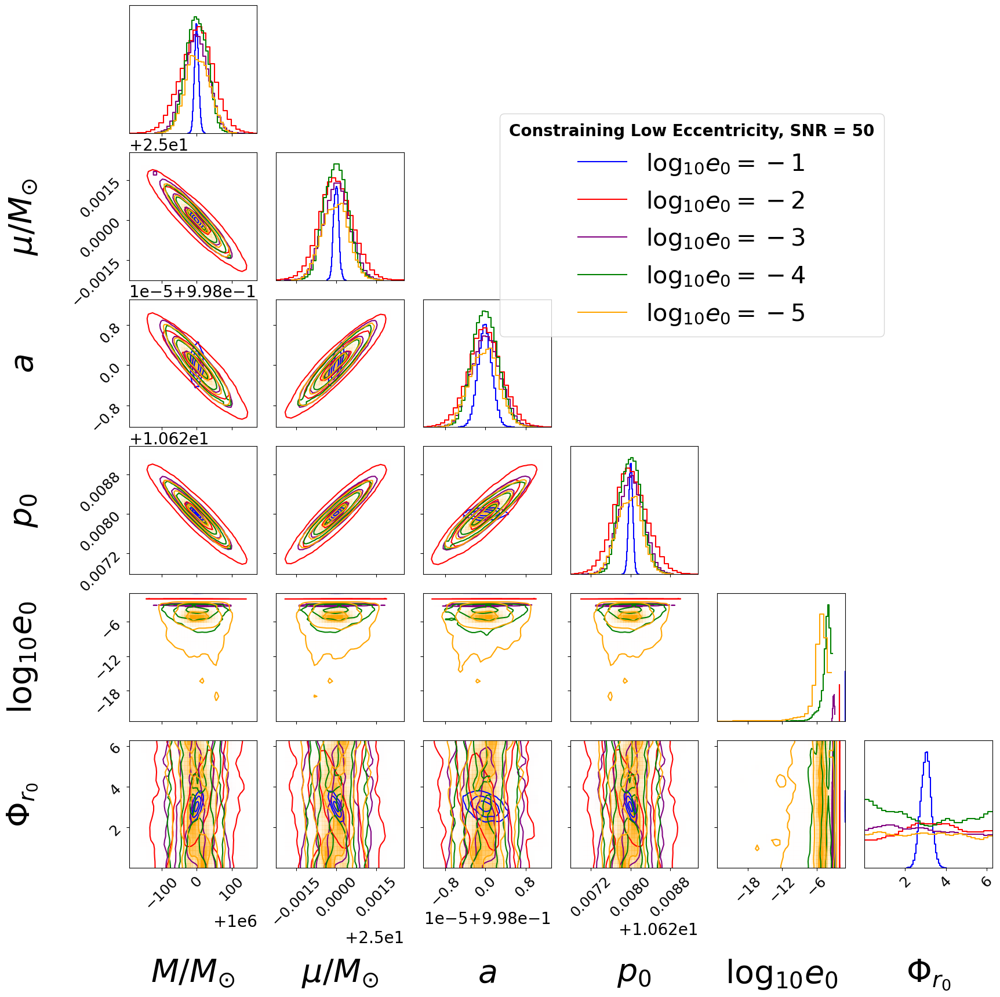

In [26]:
# Tack on radial phase?

from matplotlib.font_manager import FontProperties

EMRI_plot_name_log_e0_w_radial_phase = plot_direc + "/low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_log_e0_0p1_SNR_50_dt_5_T_2_w_radial_phase.png"


params_label_log_e0_w_radial_phase =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$\log_{10}e_{0}$", r"$\Phi_{r_0}$"] 

true_vals_w_radial_phase = np.array([1e6,25,0.998, 10.628, np.log10(0.1),  3.0])

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_log_e0_w_radial_phase, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

N_params = len(params_label_log_e0_w_radial_phase)

figure = corner.corner(samples_after_burnin_EMRI_log_e0_neg_1_w_radial_phase,bins = 30, color = 'blue', **corner_kwargs)

corner.corner(samples_after_burnin_EMRI_log_e0_neg_2_w_radial_phase, fig = figure, bins = 30, color = 'red', **corner_kwargs)
corner.corner(samples_after_burnin_EMRI_log_e0_neg_3_w_radial_phase, fig = figure, bins = 30, color = 'purple', **corner_kwargs)
corner.corner(samples_after_burnin_EMRI_log_e0_neg_4_w_radial_phase, fig = figure, weights = 2*np.ones(len(samples_after_burnin_EMRI_log_e0_neg_4_w_radial_phase[:,0])), bins = 30, color = 'green', **corner_kwargs)
corner.corner(samples_after_burnin_EMRI_log_e0_neg_5_w_radial_phase, fig = figure, weights = 2*np.ones(len(samples_after_burnin_EMRI_log_e0_neg_5_w_radial_phase[:,0])), bins = 30, color = 'orange', **corner_kwargs)

axes = np.array(figure.axes).reshape((N_params, N_params))

# for i in range(N_params):
#     ax = axes[i, i]
#     ax.axvline(true_vals_w_radial_phase[i], color="k")

# for yi in range(N_params):
#     for xi in range(yi):
#         ax = axes[yi, xi]
#         ax.axhline(true_vals_w_radial_phase[yi], color="k")
#         ax.axvline(true_vals_w_radial_phase[xi],color= "k")
#         ax.plot(true_vals_w_radial_phase[xi], true_vals_w_radial_phase[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)

blue_line = mlines.Line2D([], [], color='blue', label=r'$\log_{10}e_{0} = -1$')
red_line = mlines.Line2D([], [], color='red', label=r'$\log_{10}e_{0} = -2$')
purple_line = mlines.Line2D([], [], color='purple', label=r'$\log_{10}e_{0} = -3$')
green_line = mlines.Line2D([], [], color='green', label=r'$\log_{10}e_{0} = -4$')
orange_line = mlines.Line2D([], [], color='orange', label=r'$\log_{10}e_{0} = -5$')

plt.legend(handles=[blue_line, red_line, purple_line, green_line, orange_line], fontsize = 30, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "Constraining Low Eccentricity, SNR = 50", title_fontproperties = FontProperties(size = 20 , weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)

plt.savefig(EMRI_plot_name_log_e0_w_radial_phase, bbox_inches = "tight")

# figure_EMRI_0p1 = corner_plot(samples_after_burnin_EMRI_log_e0_neg_1_w_radial_phase, true_vals_w_radial_phase, params_label_log_e0_w_radial_phase, corner_kwargs, plot_name = EMRI_plot_name_log_e0_w_radial_phase, trunc_samps = False)

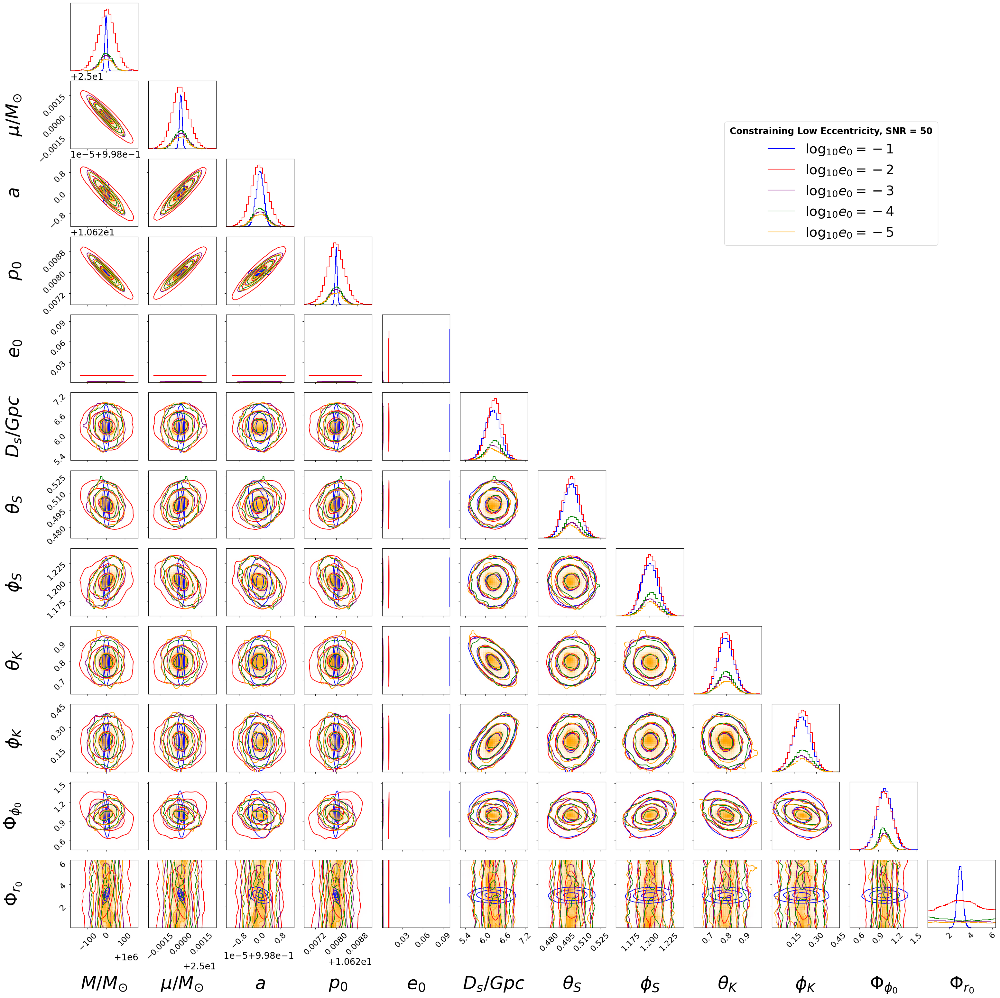

In [27]:
# Tack on radial phase?

from matplotlib.font_manager import FontProperties

EMRI_plot_name_log_e0_w_radial_phase = plot_direc + "/low_e0_Kerr_M_1e6_mu_25_a_0p998_p0_10p628_log_e0_0p1_SNR_50_dt_5_T_2_w_radial_phase.png"


params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

# ktrue_vals_w_radial_phase = np.array([1e6,25,0.998, 10.628, np.log10(0.1),  3.0])

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

N_params = len(params_label_full)

samples_after_burnin_EMRI_e0_0p1_stacked = np.column_stack(samples_after_burnin_EMRI_e0_0p1)
samples_after_burnin_EMRI_e0_0p01_stacked = np.column_stack(samples_after_burnin_EMRI_e0_0p01)
samples_after_burnin_EMRI_e0_0p001_stacked = np.column_stack(samples_after_burnin_EMRI_e0_0p001)
samples_after_burnin_EMRI_e0_0p0001_stacked = np.column_stack(samples_after_burnin_EMRI_e0_0p0001)
samples_after_burnin_EMRI_e0_0p00001_stacked = np.column_stack(samples_after_burnin_EMRI_e0_0p00001)

figure = corner.corner(samples_after_burnin_EMRI_e0_0p1_stacked,bins = 30, color = 'blue', **corner_kwargs)

corner.corner(samples_after_burnin_EMRI_e0_0p01_stacked, fig = figure, bins = 30,  weights = 3*np.ones(len(samples_after_burnin_EMRI_e0_0p01[0][:,0])), color = 'red', **corner_kwargs)
corner.corner(samples_after_burnin_EMRI_e0_0p001_stacked, fig = figure, bins = 30, color = 'purple', **corner_kwargs)
corner.corner(samples_after_burnin_EMRI_e0_0p0001_stacked, fig = figure, weights = 3*np.ones(len(samples_after_burnin_EMRI_e0_0p0001[0][:,0])), bins = 30, color = 'green', **corner_kwargs)
corner.corner(samples_after_burnin_EMRI_e0_0p00001_stacked, fig = figure, weights = 3*np.ones(len(samples_after_burnin_EMRI_e0_0p00001[0][:,0])), bins = 30, color = 'orange', **corner_kwargs)

axes = np.array(figure.axes).reshape((N_params, N_params))

# for i in range(N_params):
#     ax = axes[i, i]
#     ax.axvline(true_vals_w_radial_phase[i], color="k")

# for yi in range(N_params):
#     for xi in range(yi):
#         ax = axes[yi, xi]
#         ax.axhline(true_vals_w_radial_phase[yi], color="k")
#         ax.axvline(true_vals_w_radial_phase[xi],color= "k")
#         ax.plot(true_vals_w_radial_phase[xi], true_vals_w_radial_phase[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)

blue_line = mlines.Line2D([], [], color='blue', label=r'$\log_{10}e_{0} = -1$')
red_line = mlines.Line2D([], [], color='red', label=r'$\log_{10}e_{0} = -2$')
purple_line = mlines.Line2D([], [], color='purple', label=r'$\log_{10}e_{0} = -3$')
green_line = mlines.Line2D([], [], color='green', label=r'$\log_{10}e_{0} = -4$')
orange_line = mlines.Line2D([], [], color='orange', label=r'$\log_{10}e_{0} = -5$')

plt.legend(handles=[blue_line, red_line, purple_line, green_line, orange_line], fontsize = 30, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "Constraining Low Eccentricity, SNR = 50", title_fontproperties = FontProperties(size = 20 , weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)

plt.savefig(EMRI_plot_name_log_e0_w_radial_phase, bbox_inches = "tight")

# figure_EMRI_0p1 = corner_plot(samples_after_burnin_EMRI_log_e0_neg_1_w_radial_phase, true_vals_w_radial_phase, params_label_log_e0_w_radial_phase, corner_kwargs, plot_name = EMRI_plot_name_log_e0_w_radial_phase, trunc_samps = False)

In [28]:
log10_e0_samps = np.array([samples_after_burnin_EMRI_log_e0_neg_1_w_radial_phase[:,4],
            samples_after_burnin_EMRI_log_e0_neg_2_w_radial_phase[:,4],
            samples_after_burnin_EMRI_log_e0_neg_3_w_radial_phase[:,4],
            samples_after_burnin_EMRI_log_e0_neg_4_w_radial_phase[:,4],
            samples_after_burnin_EMRI_log_e0_neg_5_w_radial_phase[:,4]])

e0_samps = 10**(log10_e0_samps)

/work/scratch/env/burkeol/.conda/envs/few_1PA_trex/lib/python3.7/site-packages/ipykernel_launcher.py:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  """


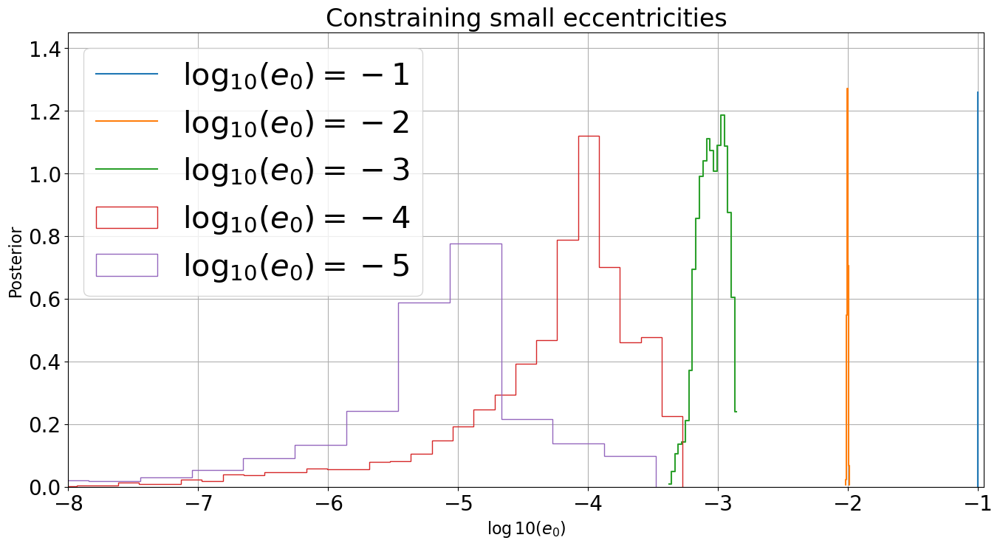

In [37]:
# plt.hist(e0_samps[0], bins = 60, label = r'$\log_{10}(e_0) = -1$')
# plt.hist(e0_samps[1], bins = 60, density = True, label = r'$\log_{10}(e_0) = -2$');

# plt.hist(e0_samps[2], bins=50, density=True, histtype='step', label=r'$\log_{10}(e_0) = -3$')
plt.figure(figsize=(16, 8))

hist_values, bin_edges = np.histogram(log10_e0_samps[0], bins=20, density=True)
# Scale the height of the histogram
scaling_factor = 1.1e-4  # Adjust as needed
hist_values *= scaling_factor  # Reduce the height

# Use plt.step() for a step-style histogram
plt.step(bin_edges[:-1], hist_values, where="mid", label=r'$\log_{10}(e_0) = -1$')


hist_values, bin_edges = np.histogram(log10_e0_samps[1], bins=20, density=True)
# Scale the height of the histogram
scaling_factor = 1.5e-2  # Adjust as needed
hist_values *= scaling_factor  # Reduce the height

# Use plt.step() for a step-style histogram
plt.step(bin_edges[:-1], hist_values, where="mid", label=r'$\log_{10}(e_0) = -2$')


hist_values, bin_edges = np.histogram(log10_e0_samps[2], bins=20, density=True)
# plt.step(bin_edges[:-1], hist_values * 0.5, width=np.diff(bin_edges), histtype = 'step', label=r'$\log_{10}(e_0) = -3$')

# Scale the height of the histogram
scaling_factor = 0.35  # Adjust as needed
hist_values *= scaling_factor  # Reduce the height

# Use plt.step() for a step-style histogram
plt.step(bin_edges[:-1], hist_values, where="mid", label=r'$\log_{10}(e_0) = -3$')


plt.hist(log10_e0_samps[3], bins=50, density=True, histtype='step', label=r'$\log_{10}(e_0) = -4$')
plt.hist(log10_e0_samps[4], bins=50, density=True, histtype='step', label=r'$\log_{10}(e_0) = -5$')


# plt.hist(e0_samps[2], bins = 20, density = True, label = r'$\log_{10}(e_0) = -3$');
# plt.hist(e0_samps[3], bins = 100, density = True, label = r'$\log_{10}(e_0) = -4$');
# plt.hist(e0_samps[4], bins = 100, density = True, label = r'$\log_{10}(e_0) = -5$');
plt.legend(fontsize = 30)
plt.grid(True)
# plt.xscale('log')
plt.xlim([-8,-0.95]);
plt.ylim([0,1.45]);
plt.xlabel(r'$\log10(e_0)$', fontsize = 16)
plt.ylabel('Posterior', fontsize = 16)
plt.title(r'Constraining small eccentricities')
plt.show()

Text(0, 0.5, 'Posterior')

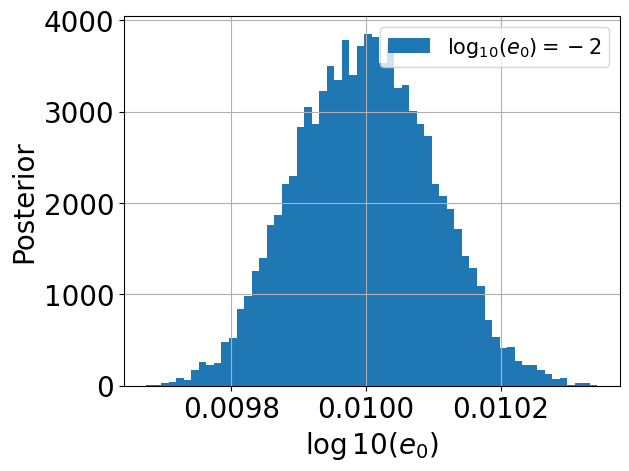

In [38]:
plt.hist(e0_samps[1], bins = 60, density = True, label = r'$\log_{10}(e_0) = -2$');
plt.legend(fontsize = 15)
plt.grid(True)
# plt.xscale('log')
# plt.xlim([-8,-2.5]);
plt.xlabel(r'$\log10(e_0)$')
plt.ylabel('Posterior')
# plt.ylim([0,4])

Text(0, 0.5, 'Posterior')

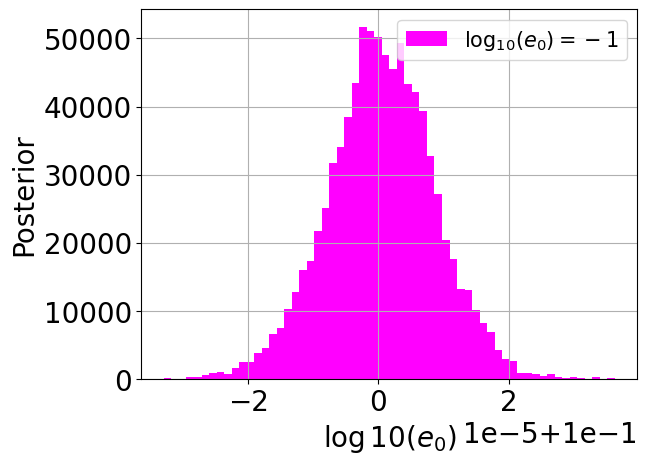

In [31]:
plt.hist(e0_samps[0], bins = 60, density = True, color='magenta', label = r'$\log_{10}(e_0) = -1$');
plt.legend(fontsize = 15)
plt.grid(True)
# plt.xscale('log')
# plt.xlim([-8,-2.5]);
plt.xlabel(r'$\log10(e_0)$')
plt.ylabel('Posterior')

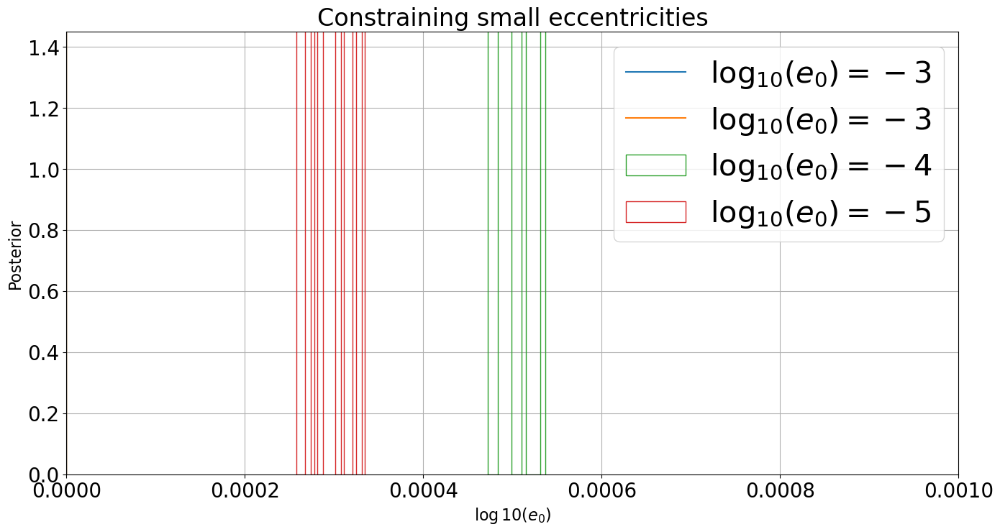

In [32]:
# Reweight? 

# plt.hist(e0_samps[0], bins = 60, label = r'$\log_{10}(e_0) = -1$')
# plt.hist(e0_samps[1], bins = 60, density = True, label = r'$\log_{10}(e_0) = -2$');

# plt.hist(e0_samps[2], bins=50, density=True, histtype='step', label=r'$\log_{10}(e_0) = -3$')
plt.figure(figsize=(16, 8))

hist_values, bin_edges = np.histogram(e0_samps[1], bins=20, density=True, weights = np.log(10) * e0_samps[1])
# Scale the height of the histogram
scaling_factor = 0.4  # Adjust as needed
hist_values *= scaling_factor  # Reduce the height

# Use plt.step() for a step-style histogram
plt.step(bin_edges[:-1], hist_values, where="mid", label=r'$\log_{10}(e_0) = -3$')

hist_values, bin_edges = np.histogram(e0_samps[2], bins=20, density=True, weights = np.log(10) * e0_samps[2])
# plt.step(bin_edges[:-1], hist_values * 0.5, width=np.diff(bin_edges), histtype = 'step', label=r'$\log_{10}(e_0) = -3$')

# Scale the height of the histogram
scaling_factor = 0.4  # Adjust as needed
hist_values *= scaling_factor  # Reduce the height

# Use plt.step() for a step-style histogram
plt.step(bin_edges[:-1], hist_values, where="mid", label=r'$\log_{10}(e_0) = -3$')


plt.hist(e0_samps[3], bins=100, density=True, histtype='step', label=r'$\log_{10}(e_0) = -4$', weights = np.log(10) * e0_samps[3])
plt.hist(e0_samps[4], bins=100, density=True, histtype='step', label=r'$\log_{10}(e_0) = -5$', weights = np.log(10) * e0_samps[4])


# plt.hist(e0_samps[2], bins = 20, density = True, label = r'$\log_{10}(e_0) = -3$');
# plt.hist(e0_samps[3], bins = 100, density = True, label = r'$\log_{10}(e_0) = -4$');
# plt.hist(e0_samps[4], bins = 100, density = True, label = r'$\log_{10}(e_0) = -5$');
plt.legend(fontsize = 30)
plt.grid(True)
# plt.xscale('log')
plt.xlim([0,1e-3]);
plt.ylim([0,1.45]);
plt.xlabel(r'$\log10(e_0)$', fontsize = 16)
plt.ylabel('Posterior', fontsize = 16)
plt.title(r'Constraining small eccentricities')
# plt.xscale('log')
plt.show()

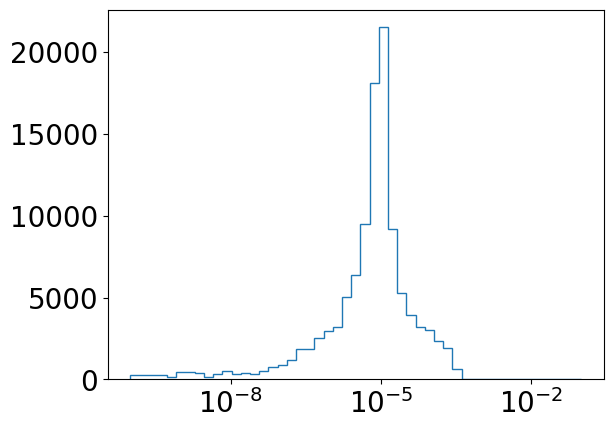

In [44]:
# plt.hist(e0_samps[1], bins=20, density=True, histtype='step', label=r'$\log_{10}(e_0) = -2$', weights = np.log(10) * e0_samps[1])
# plt.hist(e0_samps[2], bins=20, density=True, histtype='step', label=r'$\log_{10}(e_0) = -3$', weights = np.log(10) * e0_samps[2])
# plt.hist(e0_samps[3], bins=20, density=True, histtype='step', label=r'$\log_{10}(e_0) = -4$', weights = np.log(10) * e0_samps[3])
# plt.hist(e0_samps[1], density=True, bins = np.logspace(-10,-1,50), histtype='step', label=r'$\log_{10}(e_0) = -2$', weights = np.log(10) * e0_samps[1])
# plt.hist(e0_samps[2], density=True, bins = np.logspace(-10,-1,50), histtype='step', label=r'$\log_{10}(e_0) = -3$', weights = np.log(10) * e0_samps[2])
# plt.hist(e0_samps[3], density=True, bins = np.logspace(-10,-1,50), histtype='step', label=r'$\log_{10}(e_0) = -4$', weights = np.log(10) * e0_samps[3])
plt.hist(e0_samps[4], density=True, bins = np.logspace(-10,-1,50), histtype='step', label=r'$\log_{10}(e_0) = -5$', weights = np.log(10) * e0_samps[4])
plt.xscale('log')


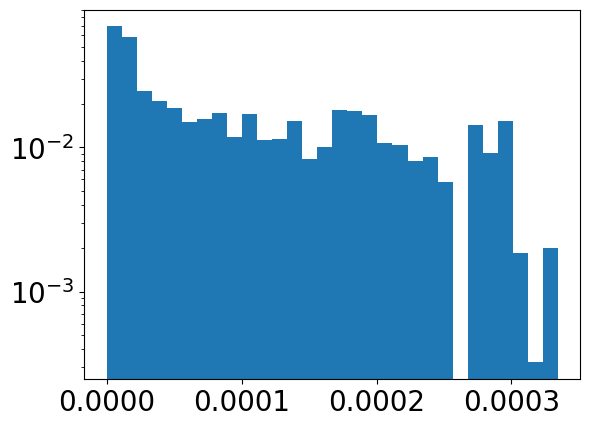

In [49]:
plt.hist(e0_samps[4], bins = 30, weights = e0_samps[4])


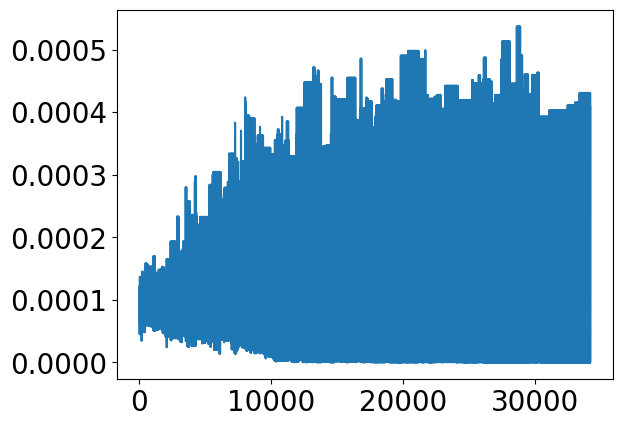

In [64]:
plt.plot(e0_samps[3])